In [1]:
import pandas as pd
# from sgt.utils_wren import get_aflow_label_from_spg_analyzer,get_aflow_label_from_spglib
from sklearn.metrics import mean_absolute_error
import json
from sklearn .metrics import accuracy_score,precision_recall_fscore_support

In [5]:
from matbench_discovery import metrics

In [4]:
from pymatgen.core import Structure,Composition
from pymatgen.symmetry.groups import SpaceGroup

import torch
import numpy as np
import pandas as pd
import re
import json
import yaml
from matbench import MatbenchBenchmark

/home/hongshuh/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
mb =  MatbenchBenchmark(subset=['matbench_perovskites'])
for task in mb.tasks:
    task.load()
    train_df = task.get_train_and_val_data(0,as_type='df')
    test_df = task.get_test_data(0,include_target=True,as_type='df')

2023-07-03 19:42:39 INFO     Initialized benchmark 'matbench_v0.1' with 1 tasks: 
['matbench_perovskites']
2023-07-03 19:42:39 INFO     Loading dataset 'matbench_perovskites'...
2023-07-03 19:42:43 INFO     Dataset 'matbench_perovskites loaded.


In [8]:
df = pd.concat([train_df,test_df],axis=0)
df

,structure,e_form
mbid,,
mb-perovskites-00001,"[[0. 0. 0.] Rh, [1.97726555 1.97726555 1.97726...",2.16
mb-perovskites-00002,"[[2.54041798 0. 0. ] Hf, [1.020...",1.52
mb-perovskites-00003,"[[0.60790913 0. 0. ] Re, [2.186...",1.48
mb-perovskites-00004,"[[2.83091357 0. 0. ] W, [2.6573...",1.24
mb-perovskites-00005,"[[0.00518937 0. 0. ] Bi, [2.172...",0.62
...,...,...
mb-perovskites-18903,"[[0.0060254 0. 0. ] B, [1.7773545...",2.78
mb-perovskites-18907,"[[2.92670828 0. 0. ] Ru, [2.815...",1.02
mb-perovskites-18909,[[7.62521884e-01 5.34123987e-19 0.00000000e+00...,1.74


In [9]:
df = df.reset_index()
df

,mbid,structure,e_form
0,mb-perovskites-00001,"[[0. 0. 0.] Rh, [1.97726555 1.97726555 1.97726...",2.16
1,mb-perovskites-00002,"[[2.54041798 0. 0. ] Hf, [1.020...",1.52
2,mb-perovskites-00003,"[[0.60790913 0. 0. ] Re, [2.186...",1.48
3,mb-perovskites-00004,"[[2.83091357 0. 0. ] W, [2.6573...",1.24
4,mb-perovskites-00005,"[[0.00518937 0. 0. ] Bi, [2.172...",0.62
...,...,...,...
18923,mb-perovskites-18903,"[[0.0060254 0. 0. ] B, [1.7773545...",2.78
18924,mb-perovskites-18907,"[[2.92670828 0. 0. ] Ru, [2.815...",1.02
18925,mb-perovskites-18909,[[7.62521884e-01 5.34123987e-19 0.00000000e+00...,1.74
18926,mb-perovskites-18917,[[6.83531987e-03 3.74228320e-18 3.74101832e-18...,1.42


In [10]:
sample = df.iloc[0]
sample

mbid                                      mb-perovskites-00001
structure    [[0. 0. 0.] Rh, [1.97726555 1.97726555 1.97726...
e_form                                                    2.16
Name: 0, dtype: object

In [ ]:
Structure.get_space_group_info

In [17]:
sample['structure'].formula

'Te1 Rh1 N3'

In [14]:
df['space_group'] = df['structure'].apply(lambda x: x.get_space_group_info()[0])
df

,mbid,structure,e_form,space_group
0,mb-perovskites-00001,"[[0. 0. 0.] Rh, [1.97726555 1.97726555 1.97726...",2.16,Pm-3m
1,mb-perovskites-00002,"[[2.54041798 0. 0. ] Hf, [1.020...",1.52,P4mm
2,mb-perovskites-00003,"[[0.60790913 0. 0. ] Re, [2.186...",1.48,Pmm2
3,mb-perovskites-00004,"[[2.83091357 0. 0. ] W, [2.6573...",1.24,Pmm2
4,mb-perovskites-00005,"[[0.00518937 0. 0. ] Bi, [2.172...",0.62,Pmm2
...,...,...,...,...
18923,mb-perovskites-18903,"[[0.0060254 0. 0. ] B, [1.7773545...",2.78,Pmmm
18924,mb-perovskites-18907,"[[2.92670828 0. 0. ] Ru, [2.815...",1.02,Pmm2
18925,mb-perovskites-18909,[[7.62521884e-01 5.34123987e-19 0.00000000e+00...,1.74,P4mm
18926,mb-perovskites-18917,[[6.83531987e-03 3.74228320e-18 3.74101832e-18...,1.42,Pm-3m


In [15]:
df.groupby('space_group').count()

,mbid,structure,e_form
space_group,,,
P4/mmm,424,424,424
P4mm,6617,6617,6617
Pm-3m,1273,1273,1273
Pmm2,10540,10540,10540
Pmmm,74,74,74


In [39]:
with open('pretrain_data/all_norm_clean.json','r') as file:
    dict = json.load(file)

In [40]:
len(dict['a'])

645953

In [6]:
df = pd.read_csv('./data/mp.csv')
df

,material_id,formula_pretty,energy_per_atom,formation_energy_per_atom,energy_above_hull,decomposition_enthalpy,energy_type,spacegroup_symbol,wyckoff_spglib,label,fomula,spg_symbol,formula
0,mp-111,Ne,-0.025937,0.000000,0.000000,0.000000,GGA,Fm-3m,A_cF4_225_a:Ne,True,Ne1,F4/m-32/m,Ne1
1,mp-568145,Ar,-0.068377,0.000431,0.000431,0.000431,GGA,P6_3/mmc,A_hP2_194_c:Ar,False,Ar1,P6_3/m2/m2/c,Ar1
2,mp-23155,Ar,-0.068808,0.000000,0.000000,0.000000,GGA,Fm-3m,A_cF4_225_a:Ar,True,Ar1,F4/m-32/m,Ar1
3,mp-1014111,Ni,-5.159898,0.620239,0.620239,0.620239,GGA,P-3m1,A_hP2_164_d:Ni,False,Ni1,P-32/m1,Ni1
4,mp-1094136,Ni,-5.040285,0.739852,0.739852,0.739852,GGA,P6/mmm,A_hP2_191_e:Ni,False,Ni1,P6/m2/m2/m,Ni1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
154710,mp-776446,Li2MnVP2(O4F)2,-7.502327,-2.734400,0.027881,0.016772,GGA+U,P-1,A2B2CD8E2F_aP48_2_3i_3i_bi_12i_3i_di:F-Li-Mn-O...,False,Li2 Mn1 V1 P2 O8 F2,P-1,Li2 Mn1 V1 P2 O8 F2
154711,mp-1177877,Li2MnVP2(O4F)2,-7.530208,-2.762281,0.000000,-0.011108,GGA+U,P-1,A2B2CD8E2F_aP16_2_i_i_b_4i_i_e:F-Li-Mn-O-P-V,True,Li2 Mn1 V1 P2 O8 F2,P-1,Li2 Mn1 V1 P2 O8 F2
154712,mp-776578,Li2MnVP2(O4F)2,-7.503856,-2.735928,0.026352,0.015244,GGA+U,P-1,A2B2CD8E2F_aP48_2_3i_3i_ai_12i_3i_ci:F-Li-Mn-O...,False,Li2 Mn1 V1 P2 O8 F2,P-1,Li2 Mn1 V1 P2 O8 F2
154713,mp-776504,Li2MnVP2(O4F)2,-7.505195,-2.737267,0.025014,0.013905,GGA+U,P-1,A2B2CD8E2F_aP48_2_3i_3i_ai_12i_3i_ci:F-Li-Mn-O...,False,Li2 Mn1 V1 P2 O8 F2,P-1,Li2 Mn1 V1 P2 O8 F2


In [8]:
from sklearn.model_selection import train_test_split,KFold

In [9]:
kf = KFold(n_splits=5)

In [16]:
import os 
for i, (train_index, test_index) in enumerate(kf.split(df)):
    train = df.iloc[train_index]
    test = df.iloc[test_index]
    os.makedirs(f'matbench_stable/fold{i}',exist_ok=True)
    train.to_csv(f'matbench_stable/fold{i}/train.csv',index=None)
    test.to_csv(f'matbench_stable/fold{i}/test.csv',index=None)


In [12]:
train

,material_id,formula_pretty,energy_per_atom,formation_energy_per_atom,energy_above_hull,decomposition_enthalpy,energy_type,spacegroup_symbol,wyckoff_spglib,label,fomula,spg_symbol,formula
0,mp-111,Ne,-0.025937,0.000000,0.000000,0.000000,GGA,Fm-3m,A_cF4_225_a:Ne,True,Ne1,F4/m-32/m,Ne1
1,mp-568145,Ar,-0.068377,0.000431,0.000431,0.000431,GGA,P6_3/mmc,A_hP2_194_c:Ar,False,Ar1,P6_3/m2/m2/c,Ar1
2,mp-23155,Ar,-0.068808,0.000000,0.000000,0.000000,GGA,Fm-3m,A_cF4_225_a:Ar,True,Ar1,F4/m-32/m,Ar1
3,mp-1014111,Ni,-5.159898,0.620239,0.620239,0.620239,GGA,P-3m1,A_hP2_164_d:Ni,False,Ni1,P-32/m1,Ni1
4,mp-1094136,Ni,-5.040285,0.739852,0.739852,0.739852,GGA,P6/mmm,A_hP2_191_e:Ni,False,Ni1,P6/m2/m2/m,Ni1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
123767,mp-556046,SrGa2B2O7,-7.414409,-2.770135,0.000000,-0.000858,GGA,Cmcm,A2B2C7D_oC48_63_g_g_ce2g_c:B-Ga-O-Sr,True,Sr1 Ga2 B2 O7,C2/m2/c2_1/m,Sr1 Ga2 B2 O7
123768,mp-1218783,Sr3Ga3B4HO14,-7.334055,-2.793387,0.013393,0.013393,GGA,P2_1,A4B3CD14E3_mP50_4_4a_3a_a_14a_3a:B-Ga-H-O-Sr,False,Sr3 Ga3 B4 H1 O14,P12_11,Sr3 Ga3 B4 H1 O14
123769,mp-615444,CrPC5Br3O5,-6.877360,-0.837213,0.540584,0.540584,GGA+U,P-1,A3B5CD5E_aP30_2_3i_5i_i_5i_i:Br-C-Cr-O-P,False,Cr1 P1 C5 Br3 O5,P-1,Cr1 P1 C5 Br3 O5
123770,mp-556473,Cr2PBrO4,-8.018866,-2.261468,0.000000,-0.047898,GGA+U,P2_1/c,AB2C4D_mP32_14_e_2e_4e_e:Br-Cr-O-P,True,Cr2 P1 Br1 O4,P12_1/c1,Cr2 P1 Br1 O4


<Axes: >

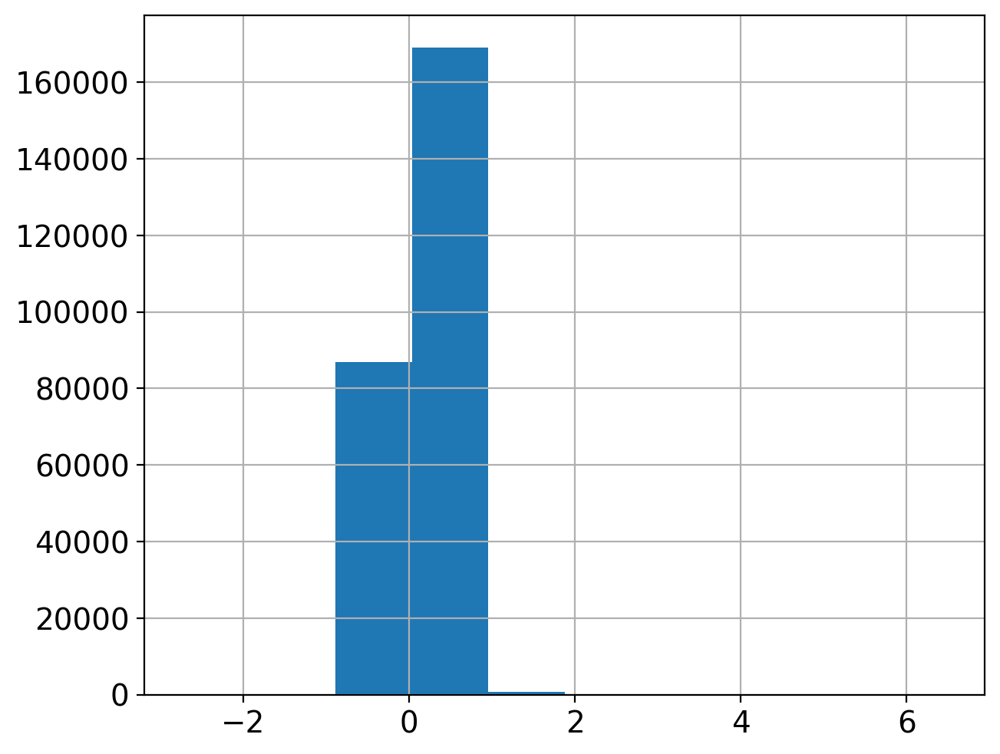

In [37]:
df['e_above_hull_mp2020_corrected_ppd_mp'].hist()


<Axes: >

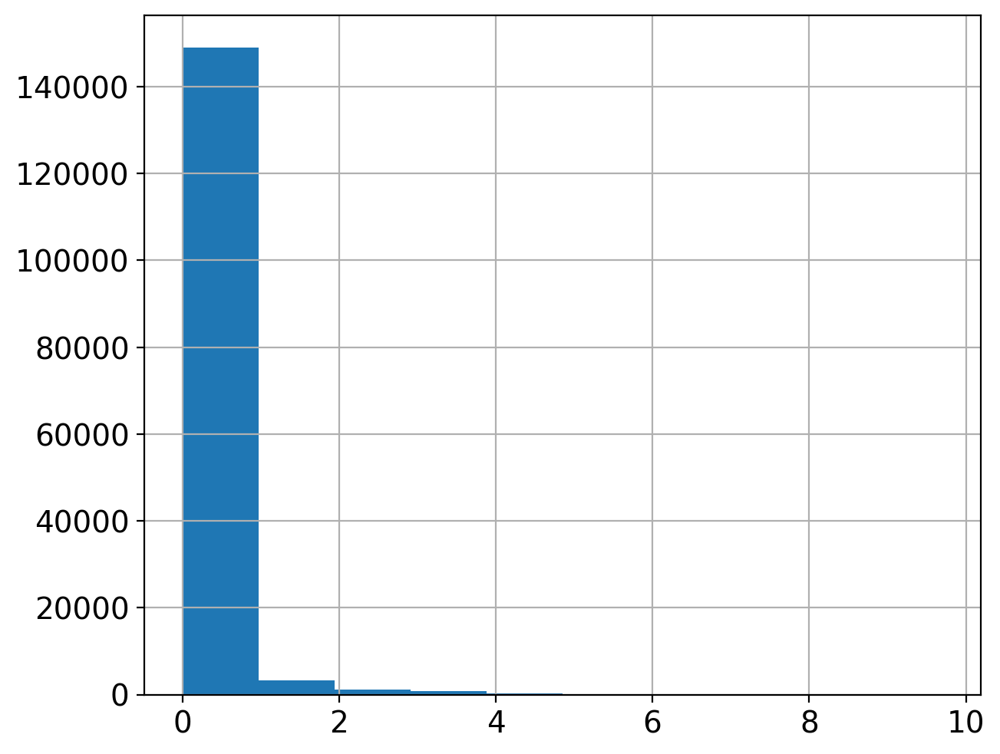

In [35]:
df['energy_above_hull'].hist()

In [39]:
import scipy.stats as scs
from sklearn.preprocessing import StandardScaler

In [41]:
sum(df['energy_above_hull']<0)

0

In [40]:
scs.boxcox(df['energy_above_hull'])

ValueError: Data must be positive.

In [111]:
len(df)/(sum(df['label']))

4.362716070270423

In [110]:
len(df)/((len(df)-sum(df['label']))*2)


0.6486893301579848

In [23]:
df2 = pd.read_csv('./pretrain_data/clean_unique_combied_all.csv')
df2

,formula,spg_symbol,abc,angles,a,b,c,alpha,beta,gama
0,Ca2 Mn2 Si2,P4/n2_1/m2/m,"[3.85943, 3.85943, 27.72391]","[90.0, 90.0, 90.0]",3.85943,3.859430,27.723910,90.0000,90.0000,90.0000
1,Rb2 Mn2 P2,P4/n2_1/m2/m,"[3.83732, 3.83732, 29.18767]","[90.0, 90.0, 90.0]",3.83732,3.837320,29.187670,90.0000,90.0000,90.0000
2,Tm1 Co2 B2 C1,I4/m2/m2/m,"[3.48342, 3.48342, 5.754212]","[107.6189, 107.6189, 90.0]",3.48342,3.483420,5.754212,107.6189,107.6189,90.0000
3,Tm2 Co4 B4 C2,I4/m2/m2/m,"[3.48665, 3.48665, 10.40624]","[90.0, 90.0, 90.0]",3.48665,3.486650,10.406240,90.0000,90.0000,90.0000
4,Tm2 Co4 B4 C2,P4mm,"[3.48665, 3.48665, 10.40624]","[90.0, 90.0, 90.0]",3.48665,3.486650,10.406240,90.0000,90.0000,90.0000
...,...,...,...,...,...,...,...,...,...,...
642454,Zn4 H74 C68 O26,P1,"[17.0774, 17.077401, 18.050584]","[90.0148, 90.037, 90.0209]",17.07740,17.077401,18.050584,90.0148,90.0370,90.0209
642455,Cu2 H28 C24 N14 O8,P1,"[9.4829, 10.654546, 10.968097]","[84.5992, 87.4517, 80.5724]",9.48290,10.654546,10.968097,84.5992,87.4517,80.5724
642456,Zn2 H13 C53 N17 O8,P1,"[9.73022, 10.54054, 10.654537]","[84.5047, 89.9999, 89.9989]",9.73022,10.540540,10.654537,84.5047,89.9999,89.9989
642457,Zn12 H72 C120 O48,P1,"[23.20324, 23.204048, 23.204068]","[60.0005, 60.0013, 60.0012]",23.20324,23.204048,23.204068,60.0005,60.0013,60.0012


In [24]:
import os
import json
df = None
# Specify the directory you want to read from
folder_path = './jdft3d/'

# List all files in the directory using os.listdir
files = os.listdir(folder_path)

# Filter the list to only JSON files
json_files = [f for f in files if f.endswith('.json')]

# Create an empty list to hold the data
data = []

# Loop through each JSON file
for json_file in json_files:
    
    # Create the full file path by joining the folder path and the file name
    file_path = os.path.join(folder_path, json_file)

    # Open each JSON file and load the data
    df = pd.concat([df,pd.read_json(file_path)])

In [3]:
with open('sgt/spg_dict.json','r') as file:
    dict = json.load(file)
dict

{'Aea2': {'full_symbol': 'Aea2',
  'spg_number': 'spg_41',
  'order': '8.0',
  'point_group': 'mm2',
  'crystal_system': 'orthorhombic',
  'laue_class': 'mmm',
  'symmetry_class': 'None',
  'polar': 'non_polar',
  'spg_token_0': 'A',
  'spg_token_1': 'e',
  'spg_token_2': 'a',
  'spg_token_3': '2'},
 'Aem2': {'full_symbol': 'Aem2',
  'spg_number': 'spg_39',
  'order': '8.0',
  'point_group': 'mm2',
  'crystal_system': 'orthorhombic',
  'laue_class': 'mmm',
  'symmetry_class': 'None',
  'polar': 'non_polar',
  'spg_token_0': 'A',
  'spg_token_1': 'e',
  'spg_token_2': 'm',
  'spg_token_3': '2'},
 'Ama2': {'full_symbol': 'Ama2',
  'spg_number': 'spg_40',
  'order': '8.0',
  'point_group': 'mm2',
  'crystal_system': 'orthorhombic',
  'laue_class': 'mmm',
  'symmetry_class': 'None',
  'polar': 'non_polar',
  'spg_token_0': 'A',
  'spg_token_1': 'm',
  'spg_token_2': 'a',
  'spg_token_3': '2'},
 'Amm2': {'full_symbol': 'Amm2',
  'spg_number': 'spg_38',
  'order': '8.0',
  'point_group': 'mm

In [5]:
vocab = []
for keys, value_dict in dict.items():
    for value_keys, values in value_dict.items():
        if values not in vocab:
            vocab.append(values)
len(vocab)

568

In [40]:
from pymatgen.core import Structure,Composition
from pymatgen.symmetry.groups import SpaceGroup
from jarvis.core.atoms import Atoms

formula_list = []
spg_list = []
a_list = []
b_list = []
c_list = []
alpha_list = []
beta_list = []
gama_list = []

for x in df['atoms']:
    try:
        atom = Atoms.from_dict(x)
        spg_symbol = SpaceGroup(atom.get_spacegroup[1]).full_symbol
        formula = atom.pymatgen_converter().formula
        abc = x['abc']
        angles = x['angles']
        a,b,c = float(abc[0]),float(abc[1]),float(abc[2])
        alpha,beta,gama = float(angles[0]),float(angles[1]),float(angles[2])
        formula_list.append(formula)
        spg_list.append(spg_symbol)
        a_list.append(a)
        b_list.append(b)
        c_list.append(c)
        alpha_list.append(alpha)
        beta_list.append(beta)
        gama_list.append(gama)
    except:
        continue

    # print(a,b,c)
    # break


/home/hongshuh/anaconda3/envs/space/lib/python3.9/site-packages/pymatgen/core/periodic_table.py:209: UserWarning: No electronegativity for He. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  warnings.warn(
/home/hongshuh/anaconda3/envs/space/lib/python3.9/site-packages/pymatgen/core/periodic_table.py:209: UserWarning: No electronegativity for Ne. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  warnings.warn(
/home/hongshuh/anaconda3/envs/space/lib/python3.9/site-packages/pymatgen/core/periodic_table.py:209: UserWarning: No electronegativity for Ar. Setting to NaN. This has no physical meaning, and is mainly done to avoid errors caused by the code expecting a float.
  warnings.warn(


In [12]:
mb = pd.read_csv('./data/mp.csv')


In [14]:
sum(mb['energy_above_hull']>0.0)

119252

In [15]:
154715/(2*119252)

0.6486893301579848

In [17]:
154715/(2*35463)

2.1813580351352115

In [18]:
119252/35463

3.3627160702704226

In [50]:
sample_dict={
    'formula':formula_list,
    'spg_symbol':spg_list,
    'a':a,
    'b':b,
    'c':c,
    'alpha':alpha,
    'beta':beta,
    'gama':gama,

}

In [38]:
with open(f'./pretrain_data/all_norm_clean.json', 'w') as json_file:
    json.dump(sample_dict, json_file)

In [76]:
with open(f'./pretrain_data/all_final.json', 'w') as json_file:
    json.dump(sample_dict, json_file)

In [52]:
sample_csv = pd.read_json('./pretrain_data/jdft3d.json')

In [2]:
combined = pd.read_csv('pretrain_data/clean_unique_combied_all.csv')
combined

,formula,spg_symbol,abc,angles,a,b,c,alpha,beta,gama
0,Ca2 Mn2 Si2,P4/n2_1/m2/m,"[3.85943, 3.85943, 27.72391]","[90.0, 90.0, 90.0]",3.85943,3.859430,27.723910,90.0000,90.0000,90.0000
1,Rb2 Mn2 P2,P4/n2_1/m2/m,"[3.83732, 3.83732, 29.18767]","[90.0, 90.0, 90.0]",3.83732,3.837320,29.187670,90.0000,90.0000,90.0000
2,Tm1 Co2 B2 C1,I4/m2/m2/m,"[3.48342, 3.48342, 5.754212]","[107.6189, 107.6189, 90.0]",3.48342,3.483420,5.754212,107.6189,107.6189,90.0000
3,Tm2 Co4 B4 C2,I4/m2/m2/m,"[3.48665, 3.48665, 10.40624]","[90.0, 90.0, 90.0]",3.48665,3.486650,10.406240,90.0000,90.0000,90.0000
4,Tm2 Co4 B4 C2,P4mm,"[3.48665, 3.48665, 10.40624]","[90.0, 90.0, 90.0]",3.48665,3.486650,10.406240,90.0000,90.0000,90.0000
...,...,...,...,...,...,...,...,...,...,...
642454,Zn4 H74 C68 O26,P1,"[17.0774, 17.077401, 18.050584]","[90.0148, 90.037, 90.0209]",17.07740,17.077401,18.050584,90.0148,90.0370,90.0209
642455,Cu2 H28 C24 N14 O8,P1,"[9.4829, 10.654546, 10.968097]","[84.5992, 87.4517, 80.5724]",9.48290,10.654546,10.968097,84.5992,87.4517,80.5724
642456,Zn2 H13 C53 N17 O8,P1,"[9.73022, 10.54054, 10.654537]","[84.5047, 89.9999, 89.9989]",9.73022,10.540540,10.654537,84.5047,89.9999,89.9989
642457,Zn12 H72 C120 O48,P1,"[23.20324, 23.204048, 23.204068]","[60.0005, 60.0013, 60.0012]",23.20324,23.204048,23.204068,60.0005,60.0013,60.0012


In [53]:
new_combined = pd.concat([sample_csv,combined.drop(columns=['abc','angles'])])
new_combined

,formula,spg_symbol,a,b,c,alpha,beta,gama
0,Tl1 Ag1 Te2,I-4m2,5.508096,5.508096,5.508100,60.0000,60.0000,60.0000
1,Ga4 Te4,P6_3/m2/m2/c,5.508096,5.508096,5.508100,60.0000,60.0000,60.0000
2,Ta1 S2,R3m,5.508096,5.508096,5.508100,60.0000,60.0000,60.0000
3,Ti2 Se2,P6_3/m2/m2/c,5.508096,5.508096,5.508100,60.0000,60.0000,60.0000
4,Nb2 S4,P6_3/m2/m2/c,5.508096,5.508096,5.508100,60.0000,60.0000,60.0000
...,...,...,...,...,...,...,...,...
642454,Zn4 H74 C68 O26,P1,17.077400,17.077401,18.050584,90.0148,90.0370,90.0209
642455,Cu2 H28 C24 N14 O8,P1,9.482900,10.654546,10.968097,84.5992,87.4517,80.5724
642456,Zn2 H13 C53 N17 O8,P1,9.730220,10.540540,10.654537,84.5047,89.9999,89.9989
642457,Zn12 H72 C120 O48,P1,23.203240,23.204048,23.204068,60.0005,60.0013,60.0012


In [55]:
new_combined.to_csv('./pretrain_data/unique_combied_all.csv',index=None)

In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [36]:
norm_a_list = scaler.fit_transform(new_combined['a'].to_numpy().reshape(-1,1)).flatten()
norm_b_list = scaler.fit_transform(new_combined['b'].to_numpy().reshape(-1,1)).flatten()
norm_c_list = scaler.fit_transform(new_combined['c'].to_numpy().reshape(-1,1)).flatten()
norm_alpha_list = scaler.fit_transform(new_combined['alpha'].to_numpy().reshape(-1,1)).flatten()
norm_beta_list = scaler.fit_transform(new_combined['beta'].to_numpy().reshape(-1,1)).flatten()
norm_gama_list = scaler.fit_transform(new_combined['gama'].to_numpy().reshape(-1,1)).flatten()

norm_a_list

array([-0.7382697 , -0.7382697 , -0.7382697 , ...,  0.05729422,
        2.59598059,  0.8701701 ])

In [37]:
sample_dict={
    'formula':new_combined['formula'].to_list(),
    'spg_symbol':new_combined['spg_symbol'].to_list(),
    'a':norm_a_list.tolist(),
    'b':norm_b_list.tolist(),
    'c':norm_c_list.tolist(),
    'alpha':norm_alpha_list.tolist(),
    'beta':norm_beta_list.tolist(),
    'gama':norm_gama_list.tolist(),

}

In [7]:
df = pd.read_json('./pretrain_data/norm_combined.json')
df

,formula,spg_symbol,a,b,c,alpha,beta,gama
0,Ca2 Mn2 Si2,P4/n2_1/m2/m,-1.040198,-1.058186,1.850505,0.042241,-0.163288,0.135576
1,Rb2 Mn2 P2,P4/n2_1/m2/m,-1.044325,-1.061562,2.038929,0.042241,-0.163288,0.135576
2,Tm1 Co2 B2 C1,I4/m2/m2/m,-1.110382,-1.115604,-0.977559,1.171639,0.842580,0.135576
3,Tm2 Co4 B4 C2,I4/m2/m2/m,-1.109779,-1.115111,-0.378723,0.042241,-0.163288,0.135576
4,Tm2 Co4 B4 C2,P4mm,-1.109779,-1.115111,-0.378723,0.042241,-0.163288,0.135576
...,...,...,...,...,...,...,...,...
642454,Zn4 H74 C68 O26,P1,1.427002,0.960234,0.605300,0.043190,-0.161175,0.136650
642455,Cu2 H28 C24 N14 O8,P1,0.009451,-0.020553,-0.306398,-0.303958,-0.308771,-0.348853
642456,Zn2 H13 C53 N17 O8,P1,0.055615,-0.037962,-0.346761,-0.310016,-0.163293,0.135520
642457,Zn12 H72 C120 O48,P1,2.570421,1.895790,1.268685,-1.880771,-1.875921,-1.405885


In [9]:
import json
with open('./sgt/spg_dict.json','r') as file:
    dict = json.load(file)


In [17]:
max = 0
for keys,values in dict.items():
    if max < len(values):
        max = len(values)
max
    # break

12

In [8]:
max_e = 0
for x in df['formula']:
    n_elements = len(x.split(' '))
    if max_e < n_elements:
        max_e = n_elements
max_e

20

In [5]:
from sgt.utils_my import get_spg_tokens

In [6]:
get_spg_tokens('P1')

['P1',
 'spg_1',
 '1.0',
 '1',
 'triclinic',
 '-1',
 'Enantiomorphic',
 'non_polar',
 'P',
 '1',
 '1',
 '1']

In [ ]:
mp = pd.read

In [2]:
df = pd.read_csv('results/test_results_matbench_mp_gap_0.csv')
df

,Unnamed: 0,Pred,GT
0,0,0.487123,2.292896e-08
1,1,0.838533,4.113000e-01
2,2,0.019563,2.292896e-08
3,3,0.019942,2.292896e-08
4,4,0.016758,2.292896e-08
...,...,...,...
21218,21218,0.020020,2.292896e-08
21219,21219,0.036800,2.292896e-08
21220,21220,5.501450,5.330400e+00
21221,21221,0.021466,2.292896e-08


In [3]:
mean_absolute_error(df['Pred'],df['GT'])

0.26726376926874884

In [56]:
wbm = pd.read_csv('./data/wbm.csv')
wbm

,material_id,formula,n_sites,volume,uncorrected_energy,e_form_per_atom_wbm,e_above_hull_wbm,bandgap_pbe,wyckoff_spglib,uncorrected_energy_from_cse,e_correction_per_atom_mp2020,e_correction_per_atom_mp_legacy,e_form_per_atom_uncorrected,e_form_per_atom_mp2020_corrected,e_above_hull_mp2020_corrected_ppd_mp,site_stats_fingerprint_init_final_norm_diff,spg_symbol,label
0,wbm-1-1,Ac6 U2,8.0,317.48,-42.954,0.550,0.550,0.0,A3B_hP8_194_h_c:Ac-U,-42.955387,0.000,0.0,0.544327,0.544327,0.544310,0.128576,P6_3/mmc,False
1,wbm-1-2,Ac1 Th3,4.0,137.42,-25.858,0.125,0.125,0.0,AB3_tI8_139_a_bd:Ac-Th,-25.858142,0.000,0.0,0.126190,0.126190,0.126152,0.051626,I4/mmm,False
2,wbm-1-3,Ac1 U3,4.0,100.81,-34.934,0.768,0.768,0.0,AB3_tI8_139_a_bd:Ac-U,-34.934045,0.000,0.0,0.765339,0.765339,0.765340,0.061782,I4/mmm,False
3,wbm-1-4,Ag2 Au1 Hg1,4.0,76.26,-9.114,0.030,0.063,0.0,A2BC_cF16_225_c_a_b:Ag-Au-Hg,-9.114021,0.000,0.0,0.032195,0.032195,0.062869,0.067272,Fm-3m,False
4,wbm-1-5,Ag2 Ba1 La1,4.0,124.15,-13.222,-0.178,0.100,0.0,A2BC_cF16_225_c_a_b:Ag-Ba-La,-13.222006,0.000,0.0,-0.175452,-0.175452,0.092193,0.050158,Fm-3m,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
256958,wbm-5-23304,I2 Te2 Zr2,6.0,203.35,-31.883,-0.911,0.021,0.0,ABC_oP6_59_a_a_b:I-Te-Zr,-31.885257,-0.267,0.0,-0.926076,-1.193076,0.019279,0.352661,Pmmn,False
256959,wbm-5-23305,Tl2 Zr2,4.0,92.16,-21.578,0.062,0.141,0.0,AB_cP2_221_a_b:Tl-Zr,-21.579593,0.000,0.0,0.060252,0.060252,0.139899,0.029811,Pm-3m,False
256960,wbm-5-23306,Pb2 Tm1 Zr1,4.0,108.43,-21.085,-0.163,0.126,0.0,A2BC_tI8_139_d_a_b:Pb-Tm-Zr,-21.081939,0.000,0.0,-0.158310,-0.158310,0.113990,0.546470,I4/mmm,False
256961,wbm-5-23307,Pb2 Tm2 Zr2,6.0,171.01,-35.591,-0.356,-0.059,0.0,ABC_tP6_129_c_c_a:Pb-Tm-Zr,-35.593295,0.000,0.0,-0.353516,-0.353516,-0.020498,0.125237,P4/nmm,True


In [17]:
df = pd.read_csv('wbm_results/classification_standard_test_results.csv')
df

,Unnamed: 0,Pred,GT
0,0,0.982358,1
1,1,0.000075,0
2,2,0.956351,1
3,3,0.974790,0
4,4,0.767833,0
...,...,...,...
30938,30938,0.999912,1
30939,30939,0.998497,0
30940,30940,0.998499,1
30941,30941,0.999728,0


In [18]:
from sklearn.metrics import accuracy_score

accuracy_score(df['Pred'],df['GT'])

ValueError: Classification metrics can't handle a mix of continuous and binary targets

In [57]:
df['Pred'] -= wbm.e_correction_per_atom_mp_legacy
df['Pred'] += wbm.e_correction_per_atom_mp2020
df

,Unnamed: 0,Pred,GT
0,0,0.549415,0.544327
1,1,0.146186,0.126190
2,2,0.679287,0.765339
3,3,-0.039353,0.032195
4,4,-0.188305,-0.175452
...,...,...,...
256958,256958,-1.394226,-1.193076
256959,256959,0.168030,0.060252
256960,256960,-0.230460,-0.158310
256961,256961,-0.361245,-0.353516


In [58]:
sum(df['GT']>=0.0)

30597

In [52]:
from matbench_discovery.metrics import stable_metrics
from matbench_discovery.plots import hist_classified_stable_vs_hull_dist,rolling_mae_vs_hull_dist


In [64]:
stable_metrics(df['GT'],df['Pred'])


{'F1': 0.07473806294352382,
 'R2': -0.38685907990150725,
 'DAF': 1.4176705281467523,
 'Precision': 0.23626646781009197,
 'Recall': 0.04438995913601868,
 'Accuracy': 0.816825768690434,
 'TPR': 0.04438995913601868,
 'FPR': 0.028696448084879842,
 'TNR': 0.9713035519151202,
 'FNR': 0.9556100408639813,
 'MAE': 0.11646324945017103,
 'RMSE': 0.19386702237506054}

In [46]:
stable_metrics(df['GT'],df['Pred'],stability_threshold=0.1)

{'F1': 0.75052243094049,
 'R2': -1.7934530486711808,
 'DAF': 1.1320152901728913,
 'Precision': 0.6464033169847742,
 'Recall': 0.8946234946943727,
 'Accuracy': 0.6603830123402981,
 'TPR': 0.8946234946943727,
 'FPR': 0.6514170113941505,
 'TNR': 0.34858298860584946,
 'FNR': 0.10537650530562731,
 'MAE': 0.13921652239614055,
 'RMSE': 0.30176514866495174}

In [47]:
hist_classified_stable_vs_hull_dist(df,'GT','Pred')

In [48]:
df['error'] = df['GT'] - df['Pred']
df

,Unnamed: 0,Pred,GT,classified,error
0,0,0.623027,0.544310,True Negative,-0.078717
1,1,0.086084,0.126152,True Negative,0.040068
2,2,0.685887,0.765340,True Negative,0.079453
3,3,0.000518,0.062869,True Negative,0.062351
4,4,0.041780,0.092193,True Negative,0.050413
...,...,...,...,...,...
256958,256958,0.130342,0.019279,True Negative,-0.111063
256959,256959,0.395349,0.139899,True Negative,-0.255450
256960,256960,0.090264,0.113990,True Negative,0.023726
256961,256961,0.002100,-0.020498,False Negative,-0.022598


In [49]:
mae_hull = rolling_mae_vs_hull_dist(df['GT'],df.iloc[:,4:])

Calculating rolling MAE: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s, error]


In [50]:
mae_hull[0]

In [32]:
accuracy_score(df['Pred'],df['GT'])


0.6288415063647296

In [34]:
df['Pred'].sum()

101809.0

In [42]:
from sklearn.metrics import precision_recall_fscore_support

precision,recall,f1,_= precision_recall_fscore_support(df['GT'],df['Pred'],average='binary')

In [43]:
total_pos = df['Pred'].sum()


In [46]:
prevalence = total_pos/len(df)


In [47]:
precision/prevalence

0.6106082424026996